In [1]:
import os
import numpy as np 
import cv2 
import pickle
import matplotlib.pyplot as plt
import random

In [2]:
# dataset dir 
dataset_dir = "./DATA/qsd2_w1/"

In [156]:
def detect_edges(image):
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    smooth_img = cv2.GaussianBlur(image,(25,25), 0)
    
    
    
    
    
    # # Apply edge detection using Canny
    # edges = cv2.Canny(smooth_img, 50, 150)

    # # Use Hough Line Transform to detect lines
    # # The function returns the end-points of the detected lines
    # lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=100, minLineLength=10, maxLineGap=5)

    # # Draw the lines on the original image
    # if lines is not None:
    #     for line in lines:
    #         x1, y1, x2, y2 = line[0]
    #         cv2.line(smooth_img, (x1, y1), (x2, y2), (255, 0, 0), 2)
    # return smooth_img

    
    # Sobel Edge Detection
    sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
    sobel = cv2.magnitude(sobel_x, sobel_y)
    _, binary_edges = cv2.threshold(sobel, 15, 255, cv2.THRESH_BINARY)
    
    
    # Define a structuring element for morphological operations
    kernel = np.ones((3,3), np.uint8)

    # Dilation to expand the edges
    dilated_edges = cv2.dilate(binary_edges, kernel, iterations=1)

    # Closing to connect broken edges
    closed_edges = cv2.morphologyEx(binary_edges, cv2.MORPH_CLOSE, kernel)
    return dilated_edges
    # # morphological opening 
    # kernel = np.ones((5,5), np.uint8)

    # # Apply morphological opening
    # opened_image = cv2.morphologyEx(binary_edges, cv2.MORPH_OPEN, kernel)
    # eroded_image = cv2.erode(opened_image, kernel, iterations=1)



    return eroded_image

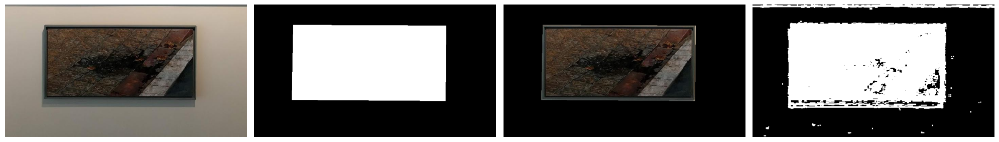

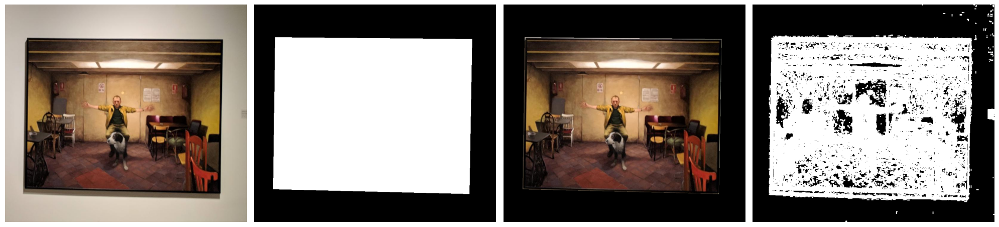

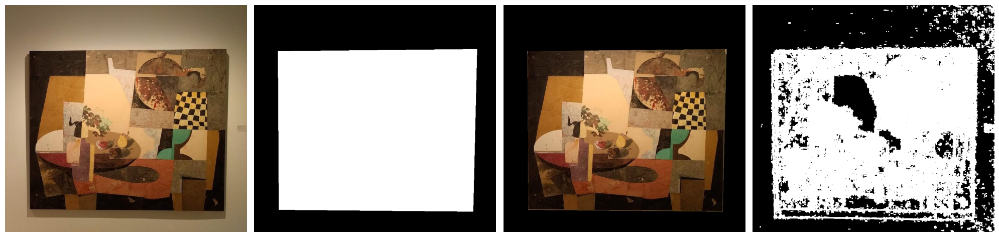

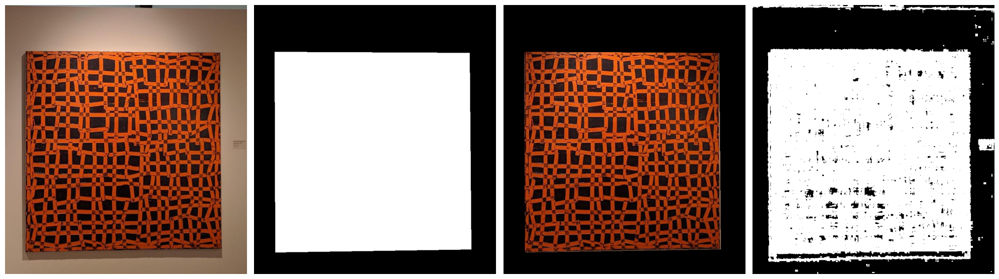

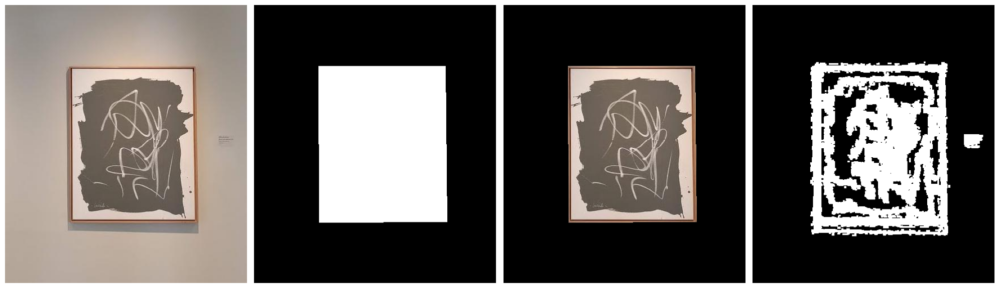

...

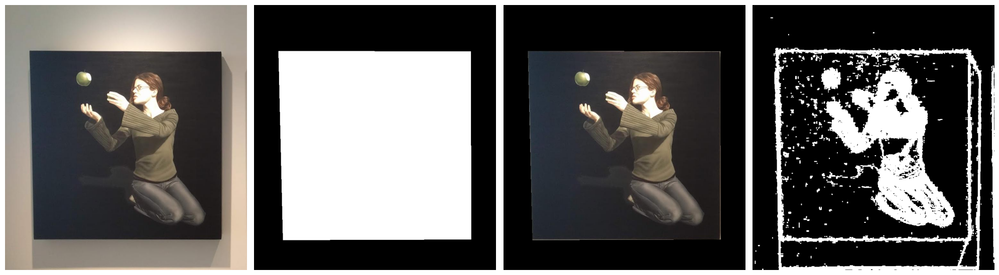

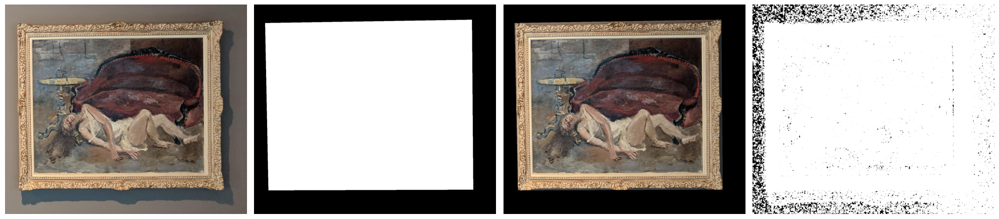

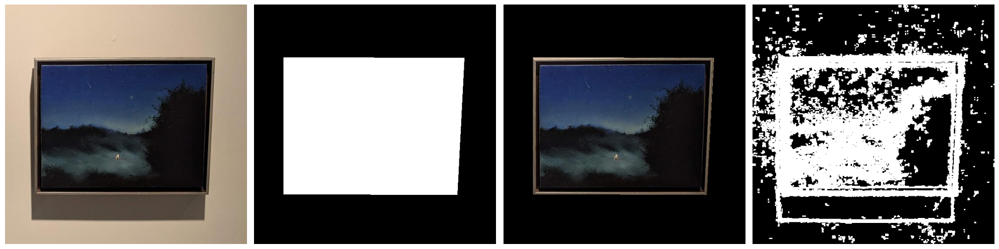

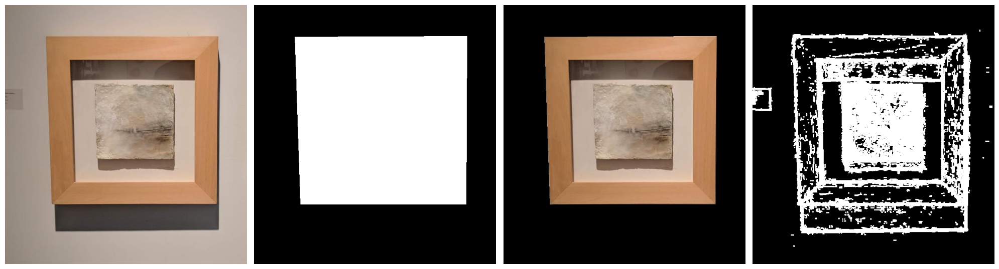

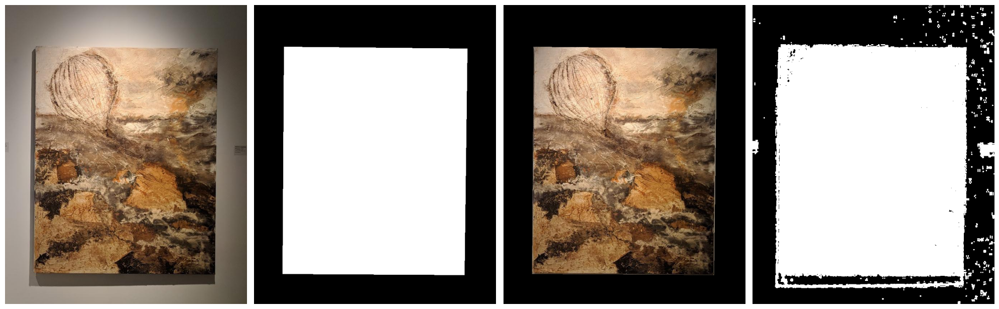

In [157]:
i =0
for file in os.listdir(dataset_dir):
    if ".jpg" in file: 
        main_img = cv2.imread(os.path.join(dataset_dir, file))
        main_img = cv2.cvtColor(main_img, cv2.COLOR_BGR2RGB)
        
        mask_img_path = file.split(".")[0]+".png"
        mask_img = cv2.imread(os.path.join(dataset_dir, mask_img_path), cv2.IMREAD_GRAYSCALE)
       
        normalized_mask = mask_img / 255


        
        fig, ax = plt.subplots(1, 4, figsize=(20, 15))  # 1 row, 2 columns
        # Displaying the first image
        ax[0].imshow(main_img)
        ax[0].axis('off')  # Hide axes

        # Displaying the grayscale image
        ax[1].imshow(mask_img, cmap='gray')
        ax[1].axis('off')  # Hide axes
        # Displaying the main_img-mask_img image
        ax[2].imshow(  cv2.bitwise_and(main_img, main_img, mask=mask_img))
        # ax[2].imshow(cv2.merge([channel * normalized_mask for channel in cv2.split(main_img)]))
        ax[2].axis('off')  # Hide axes

        
        ax[3].imshow(detect_edges(main_img), cmap='gray')
        ax[3].axis('off')  # Hide axes
        plt.tight_layout()  # Adjust layout to prevent overlap
        plt.show()
        i+=1
        # if i==3: break
        

In [28]:
# TEST 1
all_images = [file for file in os.listdir(dataset_dir) if ".jpg" in file]
def get_random_image():
    random_image_file = random.choice(all_images)
    img = cv2.imread(os.path.join(dataset_dir,random_image_file))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.show()
    return img

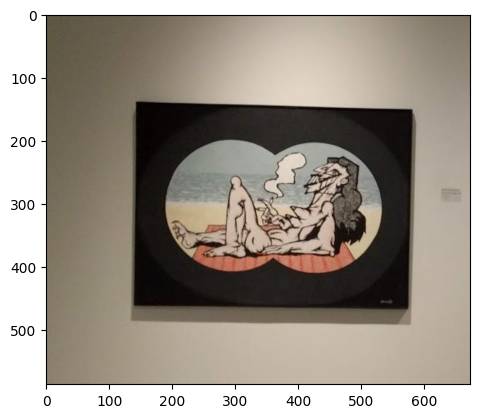

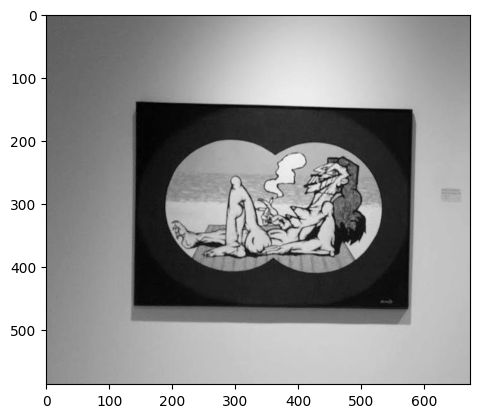

In [124]:
src_img = get_random_image()
# gray scale 
gray_img = cv2.cvtColor(src_img, cv2.COLOR_RGB2GRAY)
plt.imshow(gray_img, cmap='gray')
plt.show()



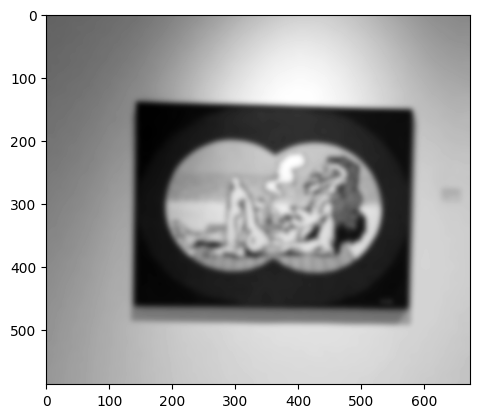

In [125]:
# smoothing 
smooth_img = cv2.GaussianBlur(gray_img,(25,25), 0)
plt.imshow(smooth_img, cmap='gray')
plt.show()

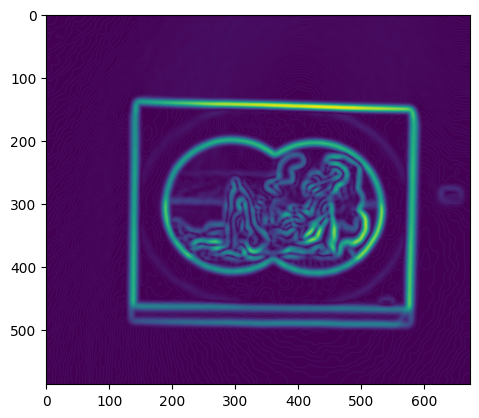

In [126]:
# Sobel Edge Detection
sobel_x = cv2.Sobel(smooth_img, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(smooth_img, cv2.CV_64F, 0, 1, ksize=3)
sobel = cv2.magnitude(sobel_x, sobel_y)

plt.imshow(sobel)

In [127]:
sobel.shape

(587, 673)

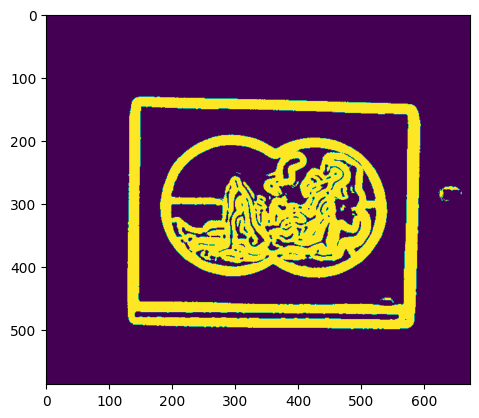

In [128]:
_, binary_edges = cv2.threshold(sobel, 15, 255, cv2.THRESH_BINARY)
plt.imshow(binary_edges)

In [129]:
# edges = cv2.Canny(smooth_img, 15, 150)
# plt.imshow(edges)

In [111]:
contours, _ = cv2.findContours(smooth_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contour = sorted(contours, key=cv2.contourArea, reverse=True)[0]
# Create an empty mask of zeros
mask = np.zeros_like(src_img)

# Fill the detected contour in the mask with ones
cv2.drawContours(mask, [contour], -1, (255), thickness=cv2.FILLED)  # 255 corresponds to 1 in uint8 format

# Convert mask values from 255 to 1
mask[mask == 255] = 1


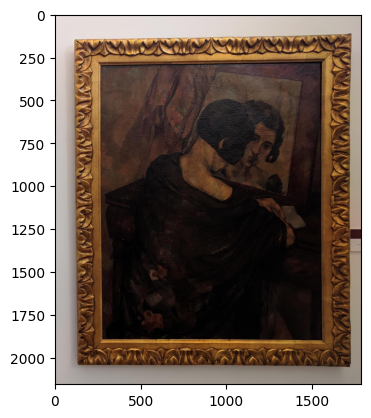

In [113]:
plt.imshow(src_img)